In [1]:
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
#         print(os.path.join(dirname, filename))
        break
        

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

In [2]:
!pip install ultralytics

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 914.9/914.9 kB 17.3 MB/s eta 0:00:00


In [3]:
import shutil
import os
import torch
from base64 import b64encode
from ultralytics import YOLO
from IPython.display import Image, HTML
from tqdm import tqdm

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


In [4]:
print("Is CUDA available:", torch.cuda.is_available())
print("Number of GPUs:", torch.cuda.device_count())
print("CUDA Device Name:", torch.cuda.get_device_name(0) if torch.cuda.is_available() else "No GPU")

Is CUDA available: True
Number of GPUs: 2
CUDA Device Name: Tesla T4


In [5]:
!nvidia-smi

Sun Feb 16 03:49:01 2025       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 560.35.03              Driver Version: 560.35.03      CUDA Version: 12.6     |
|-----------------------------------------+------------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  Tesla T4                       Off |   00000000:00:04.0 Off |                    0 |
| N/A   36C    P8              9W /   70W |       3MiB /  15360MiB |      0%      Default |
|                                         |                        |                  N/A |
+-----------------------------------------+-----

In [6]:
data_yml_path = '/kaggle/input/potholes-detection-yolov8/data.yaml'
results_path = '/kaggle/working/runs/detect/'
weights = 'yolo11n.pt' # https://docs.ultralytics.com/models/
batch_size = 64

#### Training YOLO with Distributed Data Parallel (DDP)

This script provides a Python-based approach to train the YOLO model using the Ultralytics library with multi-GPU support through PyTorch's Distributed Data Parallel (DDP).

#### Parameters Explained

- **batch_size**: Defines the batch size for each training iteration. Typical values are 32, 64, or 128, but can be adjusted based on GPU memory capacity.
- **data_path**: Specifies the path to the data configuration file, which includes dataset paths and training parameters.
- **weights**: The model's starting weights, usually from a pre-trained YOLO model.
- **devices**: Comma-separated GPU IDs for distributed training; adjust based on available GPUs.

#### Additional Resources

- **[Ultralytics Documentation](https://docs.ultralytics.com/)**: Provides detailed information on YOLO model usage, parameters, and customization options.
- **[PyTorch DDP Documentation](https://pytorch.org/docs/stable/distributed.html)**: Official documentation for using DistributedDataParallel in multi-GPU training.

In [7]:
def train_yolo_with_multi_gpu(
    data_path: str = data_yml_path,
    epochs: int = 150,
    batch_size: int = batch_size,
    weights: str = weights,
    imgsz: int = 640,
    devices: str = '0,1', 
    **kwargs
) -> None:
    
   
    model = YOLO(weights)
    
    
    model.train(
        data=data_path,
        epochs=epochs,
        batch=batch_size,
        imgsz=imgsz,
        device=devices,  
        **kwargs
    )

# Jalankan pelatihan
train_yolo_with_multi_gpu()

100%|██████████| 5.35M/5.35M [00:00<00:00, 73.2MB/s]


Ultralytics 8.3.75 🚀 Python-3.10.14 torch-2.4.0 CUDA:0 (Tesla T4, 15095MiB)
                                                 CUDA:1 (Tesla T4, 15095MiB)
engine/trainer: task=detect, mode=train, model=yolo11n.pt, data=/kaggle/input/potholes-detection-yolov8/data.yaml, epochs=150, time=None, patience=100, batch=64, imgsz=640, save=True, save_period=-1, cache=False, device=0,1, workers=8, project=None, name=train, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, 

100%|██████████| 755k/755k [00:00<00:00, 17.5MB/s]
2025-02-16 03:49:04,409	INFO util.py:124 -- Outdated packages:
  ipywidgets==7.7.1 found, needs ipywidgets>=8
Run `pip install -U ipywidgets`, then restart the notebook server for rich notebook output.
2025-02-16 03:49:04,945	INFO util.py:124 -- Outdated packages:
  ipywidgets==7.7.1 found, needs ipywidgets>=8
Run `pip install -U ipywidgets`, then restart the notebook server for rich notebook output.


Overriding model.yaml nc=80 with nc=1

                   from  n    params  module                                       arguments                     
  0                  -1  1       464  ultralytics.nn.modules.conv.Conv             [3, 16, 3, 2]                 
  1                  -1  1      4672  ultralytics.nn.modules.conv.Conv             [16, 32, 3, 2]                
  2                  -1  1      6640  ultralytics.nn.modules.block.C3k2            [32, 64, 1, False, 0.25]      
  3                  -1  1     36992  ultralytics.nn.modules.conv.Conv             [64, 64, 3, 2]                
  4                  -1  1     26080  ultralytics.nn.modules.block.C3k2            [64, 128, 1, False, 0.25]     
  5                  -1  1    147712  ultralytics.nn.modules.conv.Conv             [128, 128, 3, 2]              
  6                  -1  1     87040  ultralytics.nn.modules.block.C3k2            [128, 128, 1, True]           
  7                  -1  1    295424  ultralytics

train: Scanning /kaggle/input/potholes-detection-yolov8/train/labels... 1572 images, 0 backgrounds, 9 corrupt: 100%|██████████| 1581/1581 [00:07<00:00, 214.16it/s]


train: WARNING ⚠️ /kaggle/input/potholes-detection-yolov8/train/images/pothole_114.jpg: ignoring corrupt image/label: [Errno 30] Read-only file system: '/kaggle/input/potholes-detection-yolov8/train/images/pothole_114.jpg'
train: WARNING ⚠️ /kaggle/input/potholes-detection-yolov8/train/images/pothole_140.jpg: ignoring corrupt image/label: [Errno 30] Read-only file system: '/kaggle/input/potholes-detection-yolov8/train/images/pothole_140.jpg'
train: WARNING ⚠️ /kaggle/input/potholes-detection-yolov8/train/images/pothole_1888.jpg: ignoring corrupt image/label: [Errno 30] Read-only file system: '/kaggle/input/potholes-detection-yolov8/train/images/pothole_1888.jpg'
train: WARNING ⚠️ /kaggle/input/potholes-detection-yolov8/train/images/pothole_352.jpg: ignoring corrupt image/label: [Errno 30] Read-only file system: '/kaggle/input/potholes-detection-yolov8/train/images/pothole_352.jpg'
train: WARNING ⚠️ /kaggle/input/potholes-detection-yolov8/train/images/pothole_379.jpg: ignoring corrupt i

/opt/conda/lib/python3.10/site-packages/albumentations/__init__.py:13: UserWarning: A new version of Albumentations is available: 2.0.4 (you have 1.4.17). Upgrade using: pip install -U albumentations. To disable automatic update checks, set the environment variable NO_ALBUMENTATIONS_UPDATE to 1.
  check_for_updates()
/opt/conda/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
train: Scanning /kaggle/input/potholes-detection-yolov8/train/labels...:   0%|          | 0/1581 [00:00<?, ?it/s]

albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))


val: Scanning /kaggle/input/potholes-detection-yolov8/valid/labels... 394 images, 0 backgrounds, 2 corrupt: 100%|██████████| 396/396 [00:02<00:00, 146.41it/s]
/opt/conda/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


val: WARNING ⚠️ /kaggle/input/potholes-detection-yolov8/valid/images/pothole_1870.jpg: ignoring corrupt image/label: invalid image format GIF. Supported formats are:
images: {'tiff', 'pfm', 'tif', 'heic', 'dng', 'bmp', 'webp', 'jpeg', 'png', 'mpo', 'jpg'}
videos: {'avi', 'ts', 'mpg', 'm4v', 'asf', 'mkv', 'wmv', 'webm', 'gif', 'mov', 'mpeg', 'mp4'}
val: WARNING ⚠️ /kaggle/input/potholes-detection-yolov8/valid/images/pothole_975.jpg: ignoring corrupt image/label: [Errno 30] Read-only file system: '/kaggle/input/potholes-detection-yolov8/valid/images/pothole_975.jpg'
val: WARNING ⚠️ Cache directory /kaggle/input/potholes-detection-yolov8/valid is not writeable, cache not saved.


train: Scanning /kaggle/input/potholes-detection-yolov8/train/labels... 1572 images, 0 backgrounds, 9 corrupt: 100%|██████████| 1581/1581 [00:04<00:00, 362.60it/s]
/opt/conda/lib/python3.10/site-packages/albumentations/__init__.py:13: UserWarning: A new version of Albumentations is available: 2.0.4 (you have 1.4.17). Upgrade using: pip install -U albumentations. To disable automatic update checks, set the environment variable NO_ALBUMENTATIONS_UPDATE to 1.
  check_for_updates()


Plotting labels to runs/detect/train/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.002, momentum=0.9) with parameter groups 81 weight(decay=0.0), 88 weight(decay=0.0005), 87 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 4 dataloader workers
Logging results to runs/detect/train
Starting training for 150 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      1/150      4.93G      1.601      2.684      1.448        141        640: 100%|██████████| 25/25 [00:21<00:00,  1.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:05<00:00,  1.30it/s]


                   all        394       1393      0.312      0.299      0.245      0.131

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      2/150       4.9G      1.462      1.683      1.312        106        640: 100%|██████████| 25/25 [00:19<00:00,  1.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:04<00:00,  1.53it/s]


                   all        394       1393      0.592     0.0689      0.142     0.0702

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      3/150      5.26G      1.493      1.571      1.329        121        640: 100%|██████████| 25/25 [00:19<00:00,  1.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:04<00:00,  1.55it/s]


                   all        394       1393      0.276      0.205      0.154     0.0695


  0%|          | 0/25 [00:00<?, ?it/s]


      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      4/150      5.24G       1.55      1.537      1.374        145        640: 100%|██████████| 25/25 [00:19<00:00,  1.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:04<00:00,  1.67it/s]


                   all        394       1393      0.103      0.118     0.0541     0.0218

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      5/150      5.21G      1.568        1.5      1.383        203        640: 100%|██████████| 25/25 [00:19<00:00,  1.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:04<00:00,  1.50it/s]


                   all        394       1393      0.265       0.31      0.193     0.0823

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      6/150      5.31G      1.539      1.462      1.363         80        640: 100%|██████████| 25/25 [00:19<00:00,  1.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:04<00:00,  1.45it/s]


                   all        394       1393      0.161      0.271     0.0964     0.0405

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      7/150      5.59G      1.522       1.42      1.368         93        640: 100%|██████████| 25/25 [00:19<00:00,  1.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:04<00:00,  1.62it/s]


                   all        394       1393      0.243      0.347      0.186     0.0796

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      8/150      5.16G      1.506      1.352      1.348        137        640: 100%|██████████| 25/25 [00:19<00:00,  1.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:04<00:00,  1.48it/s]


                   all        394       1393      0.516      0.484      0.474      0.266


  0%|          | 0/25 [00:00<?, ?it/s]


      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      9/150      5.06G      1.451      1.289      1.306        150        640: 100%|██████████| 25/25 [00:18<00:00,  1.33it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:04<00:00,  1.41it/s]


                   all        394       1393      0.505      0.437      0.431       0.24

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     10/150      5.13G      1.431      1.263      1.306        128        640: 100%|██████████| 25/25 [00:18<00:00,  1.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:04<00:00,  1.40it/s]


                   all        394       1393      0.492      0.402      0.433      0.248

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     11/150      4.74G      1.404      1.247      1.286        154        640: 100%|██████████| 25/25 [00:18<00:00,  1.33it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:04<00:00,  1.55it/s]


                   all        394       1393      0.666      0.515      0.576       0.33

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     12/150      4.91G      1.398      1.236      1.302        109        640: 100%|██████████| 25/25 [00:18<00:00,  1.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:04<00:00,  1.48it/s]


                   all        394       1393      0.605      0.553      0.583      0.337

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     13/150      5.03G      1.409      1.222      1.292        122        640: 100%|██████████| 25/25 [00:19<00:00,  1.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:04<00:00,  1.50it/s]


                   all        394       1393      0.502      0.548      0.475      0.262

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     14/150      5.25G      1.409      1.237      1.294        115        640: 100%|██████████| 25/25 [00:19<00:00,  1.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:04<00:00,  1.49it/s]


                   all        394       1393      0.661      0.497      0.562      0.331

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     15/150      5.08G      1.404       1.19      1.262        136        640: 100%|██████████| 25/25 [00:19<00:00,  1.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:04<00:00,  1.63it/s]


                   all        394       1393      0.599      0.473       0.51      0.291

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     16/150      5.24G      1.373      1.176      1.277        118        640: 100%|██████████| 25/25 [00:19<00:00,  1.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:04<00:00,  1.48it/s]


                   all        394       1393      0.582      0.485      0.521      0.308

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     17/150      5.03G      1.382      1.141      1.264         86        640: 100%|██████████| 25/25 [00:19<00:00,  1.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:04<00:00,  1.47it/s]


                   all        394       1393       0.62      0.495      0.535      0.298

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     18/150      4.79G      1.337      1.145      1.262        123        640: 100%|██████████| 25/25 [00:20<00:00,  1.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:04<00:00,  1.55it/s]


                   all        394       1393      0.646      0.595       0.64      0.377

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     19/150      5.01G       1.37      1.144      1.285        185        640: 100%|██████████| 25/25 [00:19<00:00,  1.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:04<00:00,  1.58it/s]


                   all        394       1393      0.686      0.599      0.667      0.391

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     20/150      4.88G      1.365      1.107      1.248         90        640: 100%|██████████| 25/25 [00:19<00:00,  1.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:04<00:00,  1.66it/s]


                   all        394       1393      0.655       0.55        0.6      0.352

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     21/150      5.08G      1.355        1.1       1.24        100        640: 100%|██████████| 25/25 [00:19<00:00,  1.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:04<00:00,  1.59it/s]


                   all        394       1393      0.736      0.556      0.636      0.374

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     22/150      4.91G      1.317      1.083      1.243        131        640: 100%|██████████| 25/25 [00:19<00:00,  1.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:04<00:00,  1.66it/s]


                   all        394       1393      0.605      0.562      0.564      0.328


  0%|          | 0/25 [00:00<?, ?it/s]


      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     23/150      5.35G      1.335      1.069      1.225         99        640: 100%|██████████| 25/25 [00:19<00:00,  1.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:05<00:00,  1.39it/s]


                   all        394       1393      0.674      0.604      0.664      0.409

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     24/150       4.9G      1.287      1.043      1.229        112        640: 100%|██████████| 25/25 [00:18<00:00,  1.33it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:04<00:00,  1.49it/s]


                   all        394       1393      0.705      0.572      0.641      0.382

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     25/150      5.39G      1.341      1.078      1.228        201        640: 100%|██████████| 25/25 [00:19<00:00,  1.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:04<00:00,  1.56it/s]


                   all        394       1393      0.678      0.571      0.629       0.38

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     26/150      5.44G      1.298      1.027      1.232        114        640: 100%|██████████| 25/25 [00:19<00:00,  1.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:04<00:00,  1.58it/s]


                   all        394       1393      0.701      0.572      0.655      0.404


  0%|          | 0/25 [00:00<?, ?it/s]


      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     27/150         5G      1.299      1.027      1.232        137        640: 100%|██████████| 25/25 [00:19<00:00,  1.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:04<00:00,  1.47it/s]


                   all        394       1393      0.728      0.589      0.671       0.42

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     28/150       5.4G      1.294      1.015      1.207        109        640: 100%|██████████| 25/25 [00:18<00:00,  1.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:04<00:00,  1.52it/s]


                   all        394       1393      0.697      0.614       0.67      0.403

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     29/150      5.24G      1.272      1.005      1.207        129        640: 100%|██████████| 25/25 [00:19<00:00,  1.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:04<00:00,  1.51it/s]


                   all        394       1393      0.719      0.623       0.69      0.426

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     30/150      5.21G      1.267      1.008      1.206        137        640: 100%|██████████| 25/25 [00:19<00:00,  1.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:04<00:00,  1.63it/s]


                   all        394       1393      0.742      0.611      0.689       0.42

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     31/150       5.1G      1.266     0.9912      1.185        156        640: 100%|██████████| 25/25 [00:20<00:00,  1.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:04<00:00,  1.60it/s]


                   all        394       1393      0.683      0.577       0.63      0.387

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     32/150      5.27G      1.248     0.9946      1.211        177        640: 100%|██████████| 25/25 [00:18<00:00,  1.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:04<00:00,  1.48it/s]


                   all        394       1393      0.744      0.556      0.649      0.408

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     33/150      5.29G      1.275     0.9946      1.216         91        640: 100%|██████████| 25/25 [00:19<00:00,  1.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:04<00:00,  1.59it/s]


                   all        394       1393      0.743      0.594      0.676       0.43

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     34/150      5.13G      1.269      0.986      1.219        100        640: 100%|██████████| 25/25 [00:19<00:00,  1.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:04<00:00,  1.52it/s]


                   all        394       1393      0.717      0.632      0.701      0.436

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     35/150      4.93G       1.26     0.9953      1.194        229        640: 100%|██████████| 25/25 [00:19<00:00,  1.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:04<00:00,  1.58it/s]


                   all        394       1393      0.739      0.647       0.72      0.456

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     36/150      5.17G      1.228     0.9629       1.18         98        640: 100%|██████████| 25/25 [00:18<00:00,  1.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:05<00:00,  1.38it/s]


                   all        394       1393      0.714      0.649      0.705       0.43

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     37/150      5.21G      1.279     0.9782      1.207        148        640: 100%|██████████| 25/25 [00:19<00:00,  1.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:04<00:00,  1.59it/s]


                   all        394       1393      0.752      0.587      0.681      0.438

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     38/150      5.37G       1.25     0.9493      1.173        160        640: 100%|██████████| 25/25 [00:19<00:00,  1.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:04<00:00,  1.62it/s]


                   all        394       1393      0.636      0.528      0.588      0.349

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     39/150       4.9G      1.238     0.9638      1.188        101        640: 100%|██████████| 25/25 [00:19<00:00,  1.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:04<00:00,  1.46it/s]


                   all        394       1393      0.736      0.585      0.664      0.405

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     40/150      5.49G      1.238     0.9536      1.186        119        640: 100%|██████████| 25/25 [00:17<00:00,  1.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:05<00:00,  1.24it/s]


                   all        394       1393      0.742       0.65      0.719      0.454


  0%|          | 0/25 [00:00<?, ?it/s]


      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     41/150       5.1G      1.236     0.9446      1.175        163        640: 100%|██████████| 25/25 [00:19<00:00,  1.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:04<00:00,  1.61it/s]


                   all        394       1393      0.695      0.612      0.652      0.417


  0%|          | 0/25 [00:00<?, ?it/s]


      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     42/150      5.17G      1.225     0.9363      1.175         93        640: 100%|██████████| 25/25 [00:19<00:00,  1.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:04<00:00,  1.58it/s]


                   all        394       1393      0.752      0.632      0.712      0.442


  0%|          | 0/25 [00:00<?, ?it/s]


      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     43/150      5.31G      1.262     0.9631      1.194        104        640: 100%|██████████| 25/25 [00:18<00:00,  1.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:04<00:00,  1.45it/s]


                   all        394       1393      0.714      0.575      0.654      0.388

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     44/150      5.06G      1.238     0.9524      1.177        105        640: 100%|██████████| 25/25 [00:19<00:00,  1.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:05<00:00,  1.30it/s]


                   all        394       1393      0.729      0.638      0.714      0.452

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     45/150      4.94G       1.22     0.9307      1.178        102        640: 100%|██████████| 25/25 [00:20<00:00,  1.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:04<00:00,  1.40it/s]


                   all        394       1393      0.745      0.648      0.713      0.442


  0%|          | 0/25 [00:00<?, ?it/s]


      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     46/150      5.26G      1.221     0.9306      1.163         89        640: 100%|██████████| 25/25 [00:19<00:00,  1.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:04<00:00,  1.60it/s]


                   all        394       1393      0.763       0.59      0.697      0.452

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     47/150      5.22G        1.2     0.9121      1.161         95        640: 100%|██████████| 25/25 [00:19<00:00,  1.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:04<00:00,  1.62it/s]


                   all        394       1393      0.754      0.653       0.73      0.458

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     48/150      5.15G      1.212     0.8931      1.155         91        640: 100%|██████████| 25/25 [00:19<00:00,  1.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:04<00:00,  1.40it/s]


                   all        394       1393      0.773      0.626      0.734       0.47

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     49/150      5.01G      1.205     0.8934      1.154        125        640: 100%|██████████| 25/25 [00:19<00:00,  1.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:04<00:00,  1.49it/s]


                   all        394       1393      0.762      0.634      0.728      0.464

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     50/150      5.36G      1.171      0.893      1.153        120        640: 100%|██████████| 25/25 [00:18<00:00,  1.33it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:04<00:00,  1.54it/s]


                   all        394       1393      0.741      0.634      0.713       0.46

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     51/150       4.8G      1.162     0.8875       1.15        104        640: 100%|██████████| 25/25 [00:19<00:00,  1.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:04<00:00,  1.45it/s]


                   all        394       1393      0.768      0.645      0.735      0.468

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     52/150      5.32G      1.209     0.9132      1.171        172        640: 100%|██████████| 25/25 [00:18<00:00,  1.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:04<00:00,  1.44it/s]


                   all        394       1393      0.765      0.668      0.755       0.49

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     53/150      5.19G      1.195     0.9104      1.154        164        640: 100%|██████████| 25/25 [00:18<00:00,  1.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:05<00:00,  1.26it/s]


                   all        394       1393      0.752      0.652      0.733      0.463

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     54/150      5.72G      1.201     0.9019      1.159         63        640: 100%|██████████| 25/25 [00:18<00:00,  1.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:04<00:00,  1.70it/s]


                   all        394       1393      0.807      0.627       0.74      0.477

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     55/150      5.24G      1.209     0.8904      1.144         94        640: 100%|██████████| 25/25 [00:20<00:00,  1.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:04<00:00,  1.52it/s]


                   all        394       1393      0.755       0.66      0.735      0.468

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     56/150      5.38G      1.168     0.8563       1.15        140        640: 100%|██████████| 25/25 [00:19<00:00,  1.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:04<00:00,  1.50it/s]


                   all        394       1393      0.776      0.627      0.735      0.473

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     57/150      5.04G      1.155     0.8553      1.133        165        640: 100%|██████████| 25/25 [00:18<00:00,  1.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:04<00:00,  1.56it/s]


                   all        394       1393      0.766      0.642      0.725      0.463

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     58/150      5.28G       1.19     0.8664      1.133        120        640: 100%|██████████| 25/25 [00:18<00:00,  1.33it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:04<00:00,  1.54it/s]


                   all        394       1393      0.751      0.661      0.741      0.483

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     59/150      5.83G      1.157     0.8383      1.136         96        640: 100%|██████████| 25/25 [00:19<00:00,  1.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:04<00:00,  1.67it/s]


                   all        394       1393      0.742       0.68      0.745      0.478

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     60/150      4.96G      1.163     0.8437      1.137         99        640: 100%|██████████| 25/25 [00:19<00:00,  1.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:04<00:00,  1.51it/s]


                   all        394       1393      0.779       0.65      0.737      0.473

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     61/150      5.08G      1.179     0.8577      1.137        121        640: 100%|██████████| 25/25 [00:20<00:00,  1.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:04<00:00,  1.67it/s]


                   all        394       1393      0.768      0.656      0.735       0.48

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     62/150      5.01G       1.15     0.8466      1.139         82        640: 100%|██████████| 25/25 [00:19<00:00,  1.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:05<00:00,  1.39it/s]


                   all        394       1393      0.787      0.645      0.742      0.483


  0%|          | 0/25 [00:00<?, ?it/s]


      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     63/150      5.22G      1.134     0.8396      1.142        122        640: 100%|██████████| 25/25 [00:18<00:00,  1.33it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:04<00:00,  1.43it/s]


                   all        394       1393      0.744      0.651      0.731      0.472

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     64/150      5.29G      1.149     0.8307      1.127        146        640: 100%|██████████| 25/25 [00:18<00:00,  1.33it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:04<00:00,  1.52it/s]


                   all        394       1393      0.777       0.66      0.754      0.493

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     65/150      5.37G      1.163     0.8543       1.13        119        640: 100%|██████████| 25/25 [00:19<00:00,  1.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:04<00:00,  1.56it/s]


                   all        394       1393      0.795      0.625      0.732      0.476

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     66/150      4.83G      1.124     0.8123      1.133         96        640: 100%|██████████| 25/25 [00:19<00:00,  1.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:04<00:00,  1.43it/s]


                   all        394       1393       0.76      0.667      0.742      0.484

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     67/150      5.49G      1.194      0.854      1.124        146        640: 100%|██████████| 25/25 [00:19<00:00,  1.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:04<00:00,  1.62it/s]


                   all        394       1393      0.752      0.637      0.725      0.468

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     68/150      5.04G      1.151     0.8411      1.132        160        640: 100%|██████████| 25/25 [00:19<00:00,  1.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:04<00:00,  1.53it/s]


                   all        394       1393      0.798      0.648      0.753      0.489


  0%|          | 0/25 [00:00<?, ?it/s]


      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     69/150      5.01G      1.135     0.8242      1.118        122        640: 100%|██████████| 25/25 [00:19<00:00,  1.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:04<00:00,  1.64it/s]


                   all        394       1393       0.76      0.658      0.744      0.481

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     70/150      5.23G      1.146     0.8154      1.123        136        640: 100%|██████████| 25/25 [00:19<00:00,  1.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:05<00:00,  1.33it/s]


                   all        394       1393      0.736      0.675      0.724      0.455

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     71/150      5.08G      1.173     0.8289      1.145         96        640: 100%|██████████| 25/25 [00:18<00:00,  1.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:04<00:00,  1.55it/s]


                   all        394       1393      0.761      0.673      0.748      0.482

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     72/150      5.26G      1.138     0.8186      1.116        137        640: 100%|██████████| 25/25 [00:20<00:00,  1.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:04<00:00,  1.67it/s]


                   all        394       1393      0.779      0.664      0.757      0.495

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     73/150      5.18G      1.135     0.8114      1.124        211        640: 100%|██████████| 25/25 [00:20<00:00,  1.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:04<00:00,  1.56it/s]


                   all        394       1393      0.785      0.665      0.754      0.487

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     74/150      5.48G      1.119     0.8057      1.117        107        640: 100%|██████████| 25/25 [00:19<00:00,  1.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:04<00:00,  1.62it/s]


                   all        394       1393      0.791      0.651      0.758      0.492

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     75/150         5G      1.099     0.7887      1.105        152        640: 100%|██████████| 25/25 [00:18<00:00,  1.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:04<00:00,  1.45it/s]


                   all        394       1393      0.788       0.66      0.756      0.495

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     76/150      5.15G      1.125     0.7881      1.118         97        640: 100%|██████████| 25/25 [00:19<00:00,  1.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:04<00:00,  1.60it/s]


                   all        394       1393      0.788       0.66      0.747      0.483

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     77/150      4.94G      1.122      0.807      1.117        180        640: 100%|██████████| 25/25 [00:18<00:00,  1.33it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:04<00:00,  1.41it/s]


                   all        394       1393      0.768      0.662      0.747       0.48

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     78/150       5.3G      1.116      0.795      1.121        147        640: 100%|██████████| 25/25 [00:20<00:00,  1.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:04<00:00,  1.64it/s]


                   all        394       1393      0.775        0.7      0.769       0.51

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     79/150      5.11G      1.102     0.7852       1.11         85        640: 100%|██████████| 25/25 [00:18<00:00,  1.33it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:05<00:00,  1.34it/s]


                   all        394       1393      0.791      0.691       0.77      0.509

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     80/150      4.91G      1.103     0.8026      1.111         70        640: 100%|██████████| 25/25 [00:18<00:00,  1.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:04<00:00,  1.55it/s]


                   all        394       1393      0.794      0.689      0.774      0.512

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     81/150      4.98G      1.118     0.7997      1.104        102        640: 100%|██████████| 25/25 [00:19<00:00,  1.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:04<00:00,  1.64it/s]


                   all        394       1393      0.787      0.679      0.761      0.497

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     82/150      5.07G      1.098     0.7639      1.102        122        640: 100%|██████████| 25/25 [00:19<00:00,  1.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:04<00:00,  1.52it/s]


                   all        394       1393      0.799      0.674      0.762      0.508

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     83/150      5.07G      1.121     0.7999      1.115        114        640: 100%|██████████| 25/25 [00:18<00:00,  1.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:04<00:00,  1.55it/s]


                   all        394       1393      0.797      0.641      0.745      0.487

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     84/150      5.14G      1.129     0.7816      1.113        126        640: 100%|██████████| 25/25 [00:18<00:00,  1.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:04<00:00,  1.52it/s]


                   all        394       1393      0.824      0.657      0.751      0.497

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     85/150      5.09G      1.092     0.7628      1.081        115        640: 100%|██████████| 25/25 [00:19<00:00,  1.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:04<00:00,  1.54it/s]


                   all        394       1393      0.779      0.669      0.755      0.489

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     86/150         5G      1.101     0.7782      1.103        124        640: 100%|██████████| 25/25 [00:19<00:00,  1.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:04<00:00,  1.60it/s]


                   all        394       1393      0.786      0.678      0.756      0.497

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     87/150      5.02G      1.068     0.7478      1.089         87        640: 100%|██████████| 25/25 [00:18<00:00,  1.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:05<00:00,  1.32it/s]


                   all        394       1393      0.773      0.676      0.757      0.502

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     88/150      5.43G      1.098     0.7601      1.091        108        640: 100%|██████████| 25/25 [00:18<00:00,  1.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:04<00:00,  1.50it/s]


                   all        394       1393      0.776      0.665      0.743      0.484

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     89/150      5.28G      1.091     0.7605      1.087        135        640: 100%|██████████| 25/25 [00:18<00:00,  1.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:05<00:00,  1.40it/s]


                   all        394       1393      0.755      0.676      0.746      0.488

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     90/150      5.18G      1.105     0.7779      1.101         89        640: 100%|██████████| 25/25 [00:19<00:00,  1.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:04<00:00,  1.54it/s]


                   all        394       1393      0.829      0.635      0.761      0.509

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     91/150      5.31G       1.07     0.7602      1.082        242        640: 100%|██████████| 25/25 [00:18<00:00,  1.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:05<00:00,  1.32it/s]


                   all        394       1393      0.793      0.677      0.767      0.511

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     92/150       5.2G      1.082     0.7574      1.091        110        640: 100%|██████████| 25/25 [00:19<00:00,  1.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:04<00:00,  1.53it/s]


                   all        394       1393      0.805      0.674      0.762      0.508

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     93/150      5.04G      1.088     0.7422      1.092         91        640: 100%|██████████| 25/25 [00:19<00:00,  1.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:04<00:00,  1.42it/s]


                   all        394       1393      0.817       0.68      0.771      0.511

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     94/150      5.14G      1.058     0.7326      1.082        133        640: 100%|██████████| 25/25 [00:19<00:00,  1.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:04<00:00,  1.41it/s]


                   all        394       1393      0.793      0.678      0.758      0.499

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     95/150      5.16G      1.082     0.7405      1.092         97        640: 100%|██████████| 25/25 [00:18<00:00,  1.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:04<00:00,  1.47it/s]


                   all        394       1393      0.752      0.673      0.736      0.487

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     96/150      5.19G      1.075     0.7388      1.093        131        640: 100%|██████████| 25/25 [00:18<00:00,  1.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:04<00:00,  1.45it/s]


                   all        394       1393      0.797      0.652       0.75      0.496

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     97/150      5.32G      1.053     0.7393      1.083        186        640: 100%|██████████| 25/25 [00:19<00:00,  1.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:04<00:00,  1.57it/s]


                   all        394       1393      0.774      0.677      0.753      0.498

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     98/150      4.76G      1.066     0.7378      1.083        123        640: 100%|██████████| 25/25 [00:19<00:00,  1.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:04<00:00,  1.54it/s]


                   all        394       1393      0.803       0.67      0.763      0.505


  0%|          | 0/25 [00:00<?, ?it/s]


      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     99/150      5.17G      1.044     0.7357      1.095        125        640: 100%|██████████| 25/25 [00:19<00:00,  1.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:03<00:00,  1.76it/s]


                   all        394       1393       0.78      0.675      0.758      0.504

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    100/150      5.44G      1.054     0.7247      1.065         90        640: 100%|██████████| 25/25 [00:18<00:00,  1.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:04<00:00,  1.52it/s]


                   all        394       1393       0.81      0.654      0.764      0.513

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    101/150      5.03G      1.047     0.7198      1.076        129        640: 100%|██████████| 25/25 [00:19<00:00,  1.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:04<00:00,  1.56it/s]


                   all        394       1393      0.799      0.675       0.76      0.509

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    102/150      5.03G      1.043     0.7092      1.054        165        640: 100%|██████████| 25/25 [00:19<00:00,  1.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:04<00:00,  1.55it/s]


                   all        394       1393      0.806      0.676      0.764      0.505

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    103/150      5.02G       1.04     0.7075      1.075        125        640: 100%|██████████| 25/25 [00:18<00:00,  1.33it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:04<00:00,  1.52it/s]


                   all        394       1393      0.809      0.668      0.759      0.507

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    104/150      5.15G      1.046     0.7121       1.07        150        640: 100%|██████████| 25/25 [00:18<00:00,  1.33it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:04<00:00,  1.41it/s]


                   all        394       1393      0.826      0.675      0.773      0.512

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    105/150      4.99G      1.029     0.6888      1.074        160        640: 100%|██████████| 25/25 [00:19<00:00,  1.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:04<00:00,  1.59it/s]


                   all        394       1393       0.79      0.668      0.762      0.504

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    106/150      5.15G      1.048     0.7104      1.081        111        640: 100%|██████████| 25/25 [00:20<00:00,  1.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:04<00:00,  1.67it/s]


                   all        394       1393      0.793      0.691      0.763      0.511

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    107/150      5.18G      1.026     0.6882      1.062        104        640: 100%|██████████| 25/25 [00:20<00:00,  1.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:03<00:00,  1.79it/s]


                   all        394       1393      0.781      0.696      0.763      0.515

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    108/150      5.48G      1.043     0.7058      1.084         93        640: 100%|██████████| 25/25 [00:20<00:00,  1.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:04<00:00,  1.65it/s]


                   all        394       1393        0.8      0.685      0.771       0.52

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    109/150      5.63G      1.041     0.7036      1.075        106        640: 100%|██████████| 25/25 [00:19<00:00,  1.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:04<00:00,  1.63it/s]


                   all        394       1393      0.812       0.69      0.775      0.518


  0%|          | 0/25 [00:00<?, ?it/s]


      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    110/150         5G      1.029     0.6957      1.068         94        640: 100%|██████████| 25/25 [00:19<00:00,  1.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:04<00:00,  1.58it/s]


                   all        394       1393      0.829      0.684       0.77      0.515


  0%|          | 0/25 [00:00<?, ?it/s]


      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    111/150      5.23G       1.01     0.6709      1.047        105        640: 100%|██████████| 25/25 [00:19<00:00,  1.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:04<00:00,  1.56it/s]


                   all        394       1393      0.805      0.679      0.764      0.511

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    112/150      4.91G       1.05     0.7043      1.071        120        640: 100%|██████████| 25/25 [00:19<00:00,  1.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:04<00:00,  1.54it/s]


                   all        394       1393       0.79      0.685      0.765      0.507

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    113/150      5.04G      1.021     0.6865      1.068        134        640: 100%|██████████| 25/25 [00:18<00:00,  1.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:04<00:00,  1.41it/s]


                   all        394       1393      0.786      0.685      0.766      0.507

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    114/150       4.8G      1.031     0.6938      1.077         76        640: 100%|██████████| 25/25 [00:19<00:00,  1.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:04<00:00,  1.55it/s]


                   all        394       1393      0.803       0.66      0.751      0.506

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    115/150      4.82G       1.02     0.6754      1.058        115        640: 100%|██████████| 25/25 [00:18<00:00,  1.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:04<00:00,  1.46it/s]


                   all        394       1393      0.805      0.696      0.775       0.52

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    116/150      5.44G      1.005     0.6649      1.051        153        640: 100%|██████████| 25/25 [00:19<00:00,  1.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:04<00:00,  1.49it/s]


                   all        394       1393      0.786      0.702      0.772      0.518

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    117/150      4.79G      1.031     0.6935      1.067        103        640: 100%|██████████| 25/25 [00:19<00:00,  1.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:04<00:00,  1.42it/s]


                   all        394       1393      0.781      0.695      0.767      0.515

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    118/150      5.21G     0.9934     0.6682      1.055        109        640: 100%|██████████| 25/25 [00:19<00:00,  1.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:04<00:00,  1.55it/s]


                   all        394       1393      0.795      0.694      0.767      0.516

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    119/150      6.06G      1.011      0.664      1.064        139        640: 100%|██████████| 25/25 [00:19<00:00,  1.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:04<00:00,  1.56it/s]


                   all        394       1393      0.811       0.68      0.759      0.508

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    120/150      5.59G      1.006     0.6638      1.044         88        640: 100%|██████████| 25/25 [00:19<00:00,  1.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:04<00:00,  1.52it/s]


                   all        394       1393      0.807      0.681      0.774      0.522

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    121/150      5.88G      1.011     0.6557       1.05        143        640: 100%|██████████| 25/25 [00:18<00:00,  1.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:05<00:00,  1.40it/s]


                   all        394       1393       0.78      0.707      0.776      0.523

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    122/150      5.27G     0.9942     0.6701      1.056        145        640: 100%|██████████| 25/25 [00:18<00:00,  1.33it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:04<00:00,  1.68it/s]


                   all        394       1393      0.801      0.702      0.781      0.523

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    123/150      5.23G     0.9996     0.6612      1.058        112        640: 100%|██████████| 25/25 [00:19<00:00,  1.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:04<00:00,  1.51it/s]


                   all        394       1393      0.793      0.696      0.767      0.514

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    124/150      5.02G      1.013     0.6594      1.048        176        640: 100%|██████████| 25/25 [00:19<00:00,  1.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:04<00:00,  1.60it/s]


                   all        394       1393      0.836      0.673      0.774      0.519

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    125/150      5.35G      1.015     0.6656      1.045        163        640: 100%|██████████| 25/25 [00:19<00:00,  1.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:04<00:00,  1.63it/s]


                   all        394       1393      0.838      0.666       0.77      0.521

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    126/150       5.3G     0.9746     0.6509      1.051         81        640: 100%|██████████| 25/25 [00:18<00:00,  1.33it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:04<00:00,  1.46it/s]


                   all        394       1393      0.842      0.683      0.778      0.527


  0%|          | 0/25 [00:00<?, ?it/s]


      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    127/150      4.93G     0.9903     0.6629      1.043        194        640: 100%|██████████| 25/25 [00:19<00:00,  1.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:04<00:00,  1.62it/s]


                   all        394       1393       0.79        0.7      0.772       0.52

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    128/150      5.14G      1.004     0.6605      1.051        124        640: 100%|██████████| 25/25 [00:19<00:00,  1.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:04<00:00,  1.55it/s]


                   all        394       1393      0.817      0.668      0.763      0.517

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    129/150       5.5G     0.9984     0.6499      1.043        110        640: 100%|██████████| 25/25 [00:19<00:00,  1.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:04<00:00,  1.52it/s]


                   all        394       1393      0.791      0.703      0.773      0.521

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    130/150      5.27G     0.9758     0.6473      1.044        105        640: 100%|██████████| 25/25 [00:18<00:00,  1.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:04<00:00,  1.43it/s]


                   all        394       1393      0.816      0.692      0.774      0.522


  0%|          | 0/25 [00:00<?, ?it/s]


      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    131/150      5.08G     0.9841     0.6467      1.031        114        640: 100%|██████████| 25/25 [00:19<00:00,  1.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:04<00:00,  1.55it/s]


                   all        394       1393      0.807      0.696      0.772      0.522

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    132/150      5.38G     0.9723     0.6426      1.041        147        640: 100%|██████████| 25/25 [00:19<00:00,  1.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:04<00:00,  1.70it/s]


                   all        394       1393      0.805      0.693      0.772       0.52


  0%|          | 0/25 [00:00<?, ?it/s]


      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    133/150      5.27G     0.9876     0.6485      1.044        135        640: 100%|██████████| 25/25 [00:19<00:00,  1.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:04<00:00,  1.47it/s]


                   all        394       1393      0.816      0.688      0.771      0.521

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    134/150       5.1G     0.9498     0.6359      1.045         93        640: 100%|██████████| 25/25 [00:19<00:00,  1.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:04<00:00,  1.45it/s]


                   all        394       1393       0.81      0.688       0.77       0.52

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    135/150      5.45G     0.9831     0.6437       1.04        134        640: 100%|██████████| 25/25 [00:19<00:00,  1.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:04<00:00,  1.50it/s]


                   all        394       1393      0.803      0.693      0.768       0.52

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    136/150      5.08G      0.958      0.631      1.034        138        640: 100%|██████████| 25/25 [00:19<00:00,  1.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:04<00:00,  1.53it/s]


                   all        394       1393      0.791      0.699      0.765      0.516

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    137/150      5.08G     0.9573     0.6345      1.026        136        640: 100%|██████████| 25/25 [00:20<00:00,  1.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:04<00:00,  1.70it/s]


                   all        394       1393      0.796      0.698       0.77      0.517

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    138/150      5.15G     0.9619     0.6282      1.034         74        640: 100%|██████████| 25/25 [00:19<00:00,  1.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:04<00:00,  1.55it/s]


                   all        394       1393      0.816      0.693       0.77       0.52

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    139/150      4.93G      0.976     0.6385      1.045        106        640: 100%|██████████| 25/25 [00:19<00:00,  1.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:04<00:00,  1.69it/s]


                   all        394       1393      0.795      0.705       0.77      0.519

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    140/150      5.54G     0.9529     0.6103      1.023        109        640: 100%|██████████| 25/25 [00:19<00:00,  1.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:04<00:00,  1.60it/s]


                   all        394       1393      0.808      0.687      0.763      0.518
Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))


/opt/conda/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    141/150       4.8G     0.9239     0.6062      1.017         56        640: 100%|██████████| 25/25 [00:23<00:00,  1.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:04<00:00,  1.56it/s]


                   all        394       1393      0.786       0.69      0.757      0.513

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    142/150       4.8G     0.8982     0.5601     0.9997         56        640: 100%|██████████| 25/25 [00:19<00:00,  1.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:04<00:00,  1.60it/s]


                   all        394       1393      0.808      0.681      0.763      0.515

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    143/150      4.79G     0.8902     0.5451      1.004         42        640: 100%|██████████| 25/25 [00:18<00:00,  1.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:05<00:00,  1.39it/s]


                   all        394       1393       0.83      0.671      0.763      0.515

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    144/150      5.04G      0.882      0.553     0.9906         59        640: 100%|██████████| 25/25 [00:18<00:00,  1.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:04<00:00,  1.56it/s]


                   all        394       1393      0.827      0.676      0.765      0.518

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    145/150      4.86G     0.8931     0.5542       1.01         72        640: 100%|██████████| 25/25 [00:19<00:00,  1.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:04<00:00,  1.72it/s]


                   all        394       1393      0.797      0.688      0.764      0.518

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    146/150      5.12G     0.8722     0.5355     0.9842         42        640: 100%|██████████| 25/25 [00:19<00:00,  1.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:04<00:00,  1.54it/s]


                   all        394       1393      0.821      0.673      0.763      0.519

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    147/150      5.01G     0.8935      0.533      0.988         59        640: 100%|██████████| 25/25 [00:18<00:00,  1.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:04<00:00,  1.54it/s]


                   all        394       1393      0.798      0.693      0.764      0.519

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    148/150      5.17G     0.9013     0.5525      0.988         64        640: 100%|██████████| 25/25 [00:18<00:00,  1.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:04<00:00,  1.65it/s]


                   all        394       1393      0.814      0.691      0.766      0.522

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    149/150      5.19G     0.8719     0.5365     0.9818         52        640: 100%|██████████| 25/25 [00:18<00:00,  1.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:04<00:00,  1.69it/s]


                   all        394       1393       0.81      0.694      0.767      0.522

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    150/150       5.4G     0.8748     0.5416     0.9853         59        640: 100%|██████████| 25/25 [00:18<00:00,  1.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:04<00:00,  1.67it/s]


                   all        394       1393      0.822      0.678      0.768      0.524

150 epochs completed in 1.039 hours.
Optimizer stripped from runs/detect/train/weights/last.pt, 5.5MB
Optimizer stripped from runs/detect/train/weights/best.pt, 5.5MB

Validating runs/detect/train/weights/best.pt...
Ultralytics 8.3.75 🚀 Python-3.10.14 torch-2.4.0 CUDA:0 (Tesla T4, 15095MiB)
                                                 CUDA:1 (Tesla T4, 15095MiB)
YOLO11n summary (fused): 238 layers, 2,582,347 parameters, 0 gradients, 6.3 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:04<00:00,  1.58it/s]


                   all        394       1393      0.837      0.684      0.778      0.527
Speed: 0.1ms preprocess, 2.2ms inference, 0.0ms loss, 1.7ms postprocess per image
Results saved to runs/detect/train


In [8]:
# def train_yolo_with_single_gpu(     
#     data_path: str=data_yml_path,
#     epochs: int=100,
#     batch_size: int=batch_size,
#     weights: str=weights,
#     imgsz: int=640,
#     device: str='0', 
#     **kwargs
    
#     ) -> None:
    
#     model = YOLO(weights)
    
#     model.train(
#         data=data_path,
#         epochs=epochs,
#         batch=batch_size,
#         imgsz=imgsz,
#         device=device
#     )

# train_yolo_with_single_gpu()

In [9]:
# def train_yolo_with_cpu(     
#     data_path: str=data_yml_path,
#     epochs: int=100,
#     batch_size: int=batch_size,
#     weights: str=weights,
#     imgsz: int=640,
#     device: str='cpu', 
#     **kwargs
    
#     ) -> None:
    
#     model = YOLO(weights)
    
#     model.train(
#         data=data_path,
#         epochs=epochs,
#         batch=batch_size,
#         imgsz=imgsz,
#         device=device
#     )

# train_yolo_with_cpu()

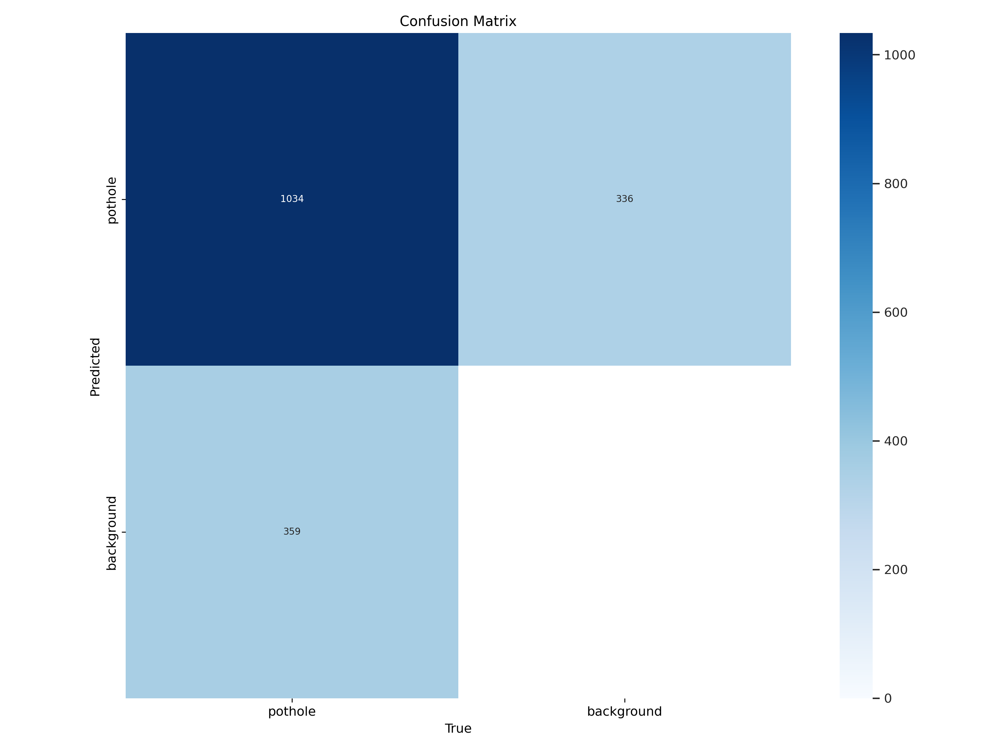

In [10]:
Image(results_path + "train/confusion_matrix.png", width=600)

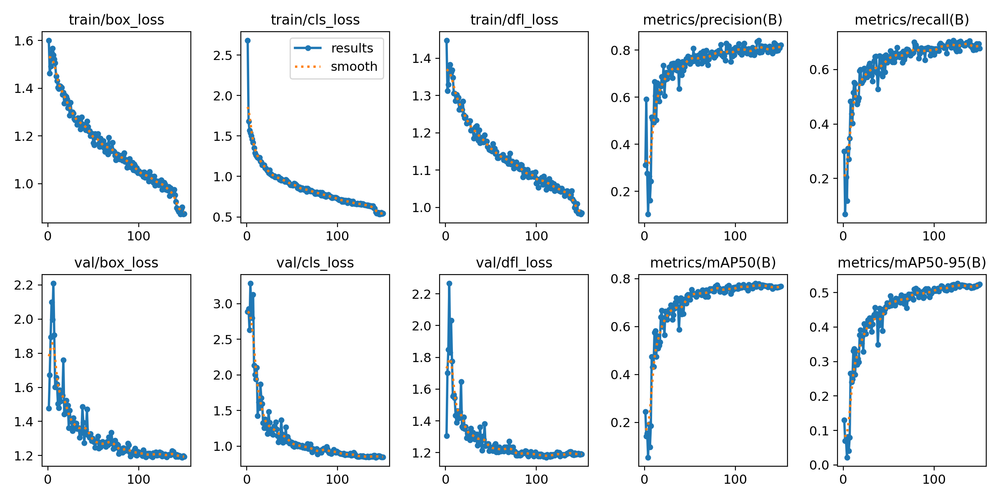

In [11]:
Image(results_path + "train/results.png", width=600)

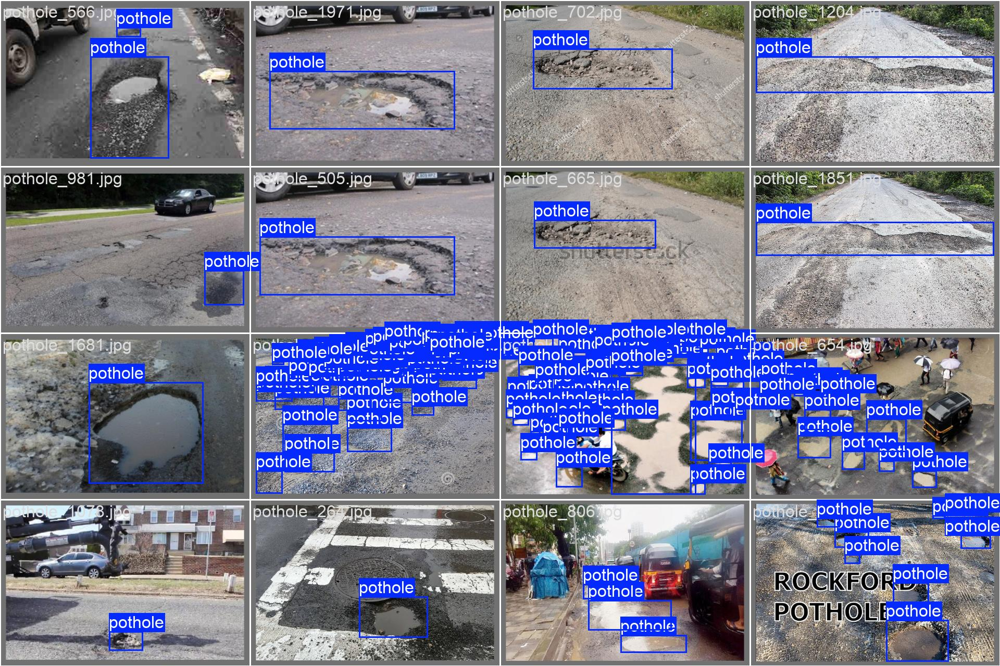

In [12]:
Image(results_path + "train/val_batch2_labels.jpg", width=800)

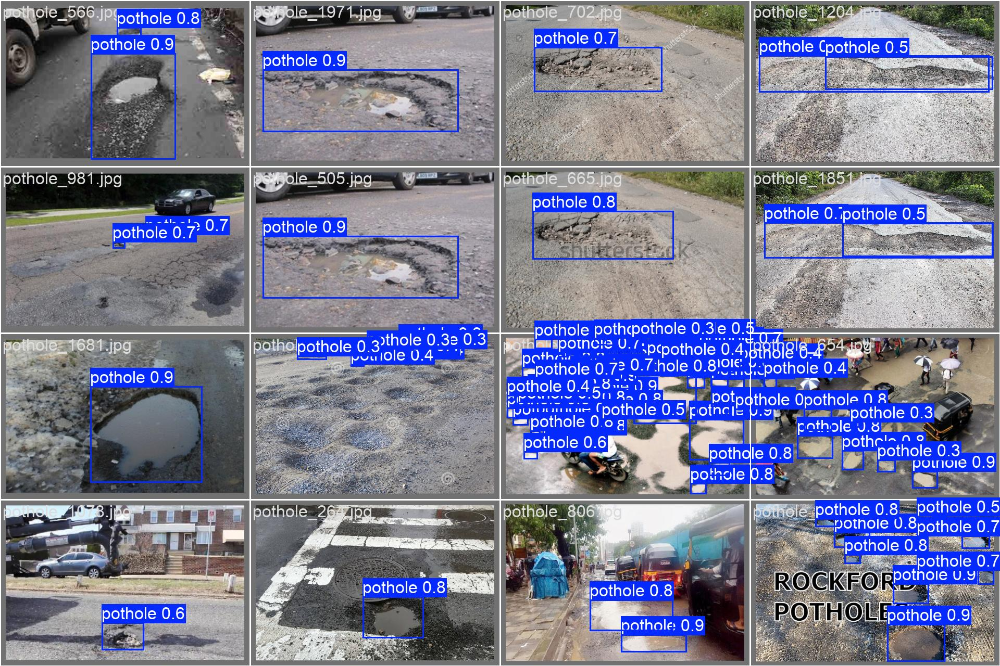

In [13]:
Image(results_path + "train/val_batch2_pred.jpg", width=800)

In [14]:
def validation_yolo_single_gpu(   
    data_path: str=data_yml_path,
    weights: str='/kaggle/working/runs/detect/train/weights/best.pt',
    imgsz: int=640,
    batch_size: int=batch_size,
    conf: float=0.25,
    iou: float=0.6,
    device: str='0', 
    **kwargs
    
    ):
    
    model = YOLO(weights)
    
    validation_results = model.val(
        data=data_path, 
        imgsz=imgsz, 
        batch=batch_size, 
        conf=conf, 
        iou=iou, 
        device=device,
        **kwargs
    )
    
    return validation_results

validation_results = validation_yolo_single_gpu()

Ultralytics 8.3.75 🚀 Python-3.10.14 torch-2.4.0 CUDA:0 (Tesla T4, 15095MiB)
YOLO11n summary (fused): 238 layers, 2,582,347 parameters, 0 gradients, 6.3 GFLOPs


val: Scanning /kaggle/input/potholes-detection-yolov8/valid/labels... 394 images, 0 backgrounds, 2 corrupt: 100%|██████████| 396/396 [00:00<00:00, 396.42it/s]

val: WARNING ⚠️ /kaggle/input/potholes-detection-yolov8/valid/images/pothole_1870.jpg: ignoring corrupt image/label: invalid image format GIF. Supported formats are:
images: {'jpg', 'png', 'webp', 'dng', 'heic', 'mpo', 'tif', 'bmp', 'jpeg', 'tiff', 'pfm'}
videos: {'mpg', 'mp4', 'avi', 'webm', 'm4v', 'asf', 'gif', 'mov', 'mpeg', 'wmv', 'mkv', 'ts'}
val: WARNING ⚠️ /kaggle/input/potholes-detection-yolov8/valid/images/pothole_975.jpg: ignoring corrupt image/label: [Errno 30] Read-only file system: '/kaggle/input/potholes-detection-yolov8/valid/images/pothole_975.jpg'
val: WARNING ⚠️ Cache directory /kaggle/input/potholes-detection-yolov8/valid is not writeable, cache not saved.



/opt/conda/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:05<00:00,  1.17it/s]


                   all        394       1393      0.839      0.684      0.792      0.581
Speed: 0.2ms preprocess, 3.9ms inference, 0.0ms loss, 3.2ms postprocess per image
Results saved to runs/detect/val


In [15]:
print(validation_results.box.map)  # mAP50-95
print(validation_results.box.map50)  # mAP50
print(validation_results.box.map75)  # mAP75
print(validation_results.box.maps)  # list of mAP50-95 for each category

0.5810601647789149
0.7916893751501731
0.6822745541134576
[    0.58106]


In [16]:
def prediction_yolo_single_gpu(   
    source: str='/kaggle/input/potholes-detection-yolov8/sample_video.mp4',
    weights: str='/kaggle/working/runs/detect/train/weights/best.pt',
    conf: float=0.25,
    save: bool=True,
    **kwargs
    ):
    
    model = YOLO(weights)

    prediction_results = model.predict(
        source=source,  # path ke data
        conf=conf,  # confidence threshold
        save=save,  # simpan hasil prediksi
        **kwargs
    )
    
    return prediction_results

prediction_results = prediction_yolo_single_gpu()



WARNING ⚠️ inference results will accumulate in RAM unless `stream=True` is passed, causing potential out-of-memory
errors for large sources or long-running streams and videos. See https://docs.ultralytics.com/modes/predict/ for help.

Example:
    results = model(source=..., stream=True)  # generator of Results objects
    for r in results:
        boxes = r.boxes  # Boxes object for bbox outputs
        masks = r.masks  # Masks object for segment masks outputs
        probs = r.probs  # Class probabilities for classification outputs

video 1/1 (frame 1/375) /kaggle/input/potholes-detection-yolov8/sample_video.mp4: 384x640 12 potholes, 54.3ms
video 1/1 (frame 2/375) /kaggle/input/potholes-detection-yolov8/sample_video.mp4: 384x640 11 potholes, 10.4ms
video 1/1 (frame 3/375) /kaggle/input/potholes-detection-yolov8/sample_video.mp4: 384x640 12 potholes, 9.7ms
video 1/1 (frame 4/375) /kaggle/input/potholes-detection-yolov8/sample_video.mp4: 384x640 11 potholes, 9.9ms
video 1/1 (frame 5

In [17]:
import os
from base64 import b64encode
from IPython.display import HTML, display

# Path of input video after prediction
save_path = '/kaggle/working/runs/detect/predict/sample_video.avi'

# Path of the output video to be compressed
compressed_path = "/kaggle/working/result_compressed.mp4"

# Kompres video menggunakan ffmpeg
os.system(f"ffmpeg -i {save_path} -vcodec libx264 {compressed_path}")

if os.path.exists(compressed_path):
    # Read the compressed video
    with open(compressed_path, "rb") as video_file:
        video_data = video_file.read()
    
    # Encode video in base64 so it can be displayed in HTML
    data_url = "data:video/mp4;base64," + b64encode(video_data).decode()

    # Embed and display video on notebook
    display(HTML(f"""
    <video width="640" height="480" controls>
          <source src="{data_url}" type="video/mp4">
    </video>
    """))
else:
    print("Video file not found.")


ffmpeg version 4.4.2-0ubuntu0.22.04.1 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11 (Ubuntu 11.2.0-19ubuntu1)
  configuration: --prefix=/usr --extra-version=0ubuntu0.22.04.1 --toolchain=hardened --libdir=/usr/lib/x86_64-linux-gnu --incdir=/usr/include/x86_64-linux-gnu --arch=amd64 --enable-gpl --disable-stripping --enable-gnutls --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libcaca --enable-libcdio --enable-libcodec2 --enable-libdav1d --enable-libflite --enable-libfontconfig --enable-libfreetype --enable-libfribidi --enable-libgme --enable-libgsm --enable-libjack --enable-libmp3lame --enable-libmysofa --enable-libopenjpeg --enable-libopenmpt --enable-libopus --enable-libpulse --enable-librabbitmq --enable-librubberband --enable-libshine --enable-libsnappy --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libtheora --enable-libtwolame --enable-libvidstab --enable-libvorbis --enable-libvpx --enab